<a href="https://colab.research.google.com/github/SergeiVKalinin/Hackathon_ML_Microscopy_2024/blob/main/Hackathon2024_Image_Vivek.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Analysis of metallographic images by the LLM-assisted bag of features, clustering transform, and variational autoencoder (VAE) based segmentation.
- Data by Vivek Chawla
- Segmentation workflow by Sergei V. Kalinin, sergei2@utk.edu

In this notebook, we will try to segment highly noisy images using the bag of features segmentation approach.

# Image import

In [19]:
!gdown https://drive.google.com/file/d/12c2C-tGC5JQBgoLJvHNLl8MPnuWamell/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=12c2C-tGC5JQBgoLJvHNLl8MPnuWamell
To: /content/Main image_C-Laser DIC_20241119170035.png
100% 4.00M/4.00M [00:00<00:00, 283MB/s]


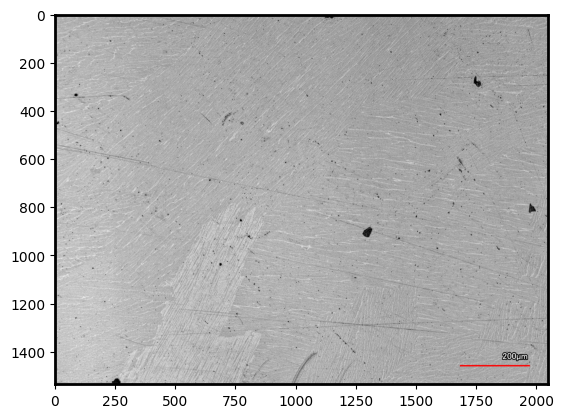

In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('/content/Main image_C-Laser DIC_20241119170035.png')
plt.imshow(image)
plt.show()

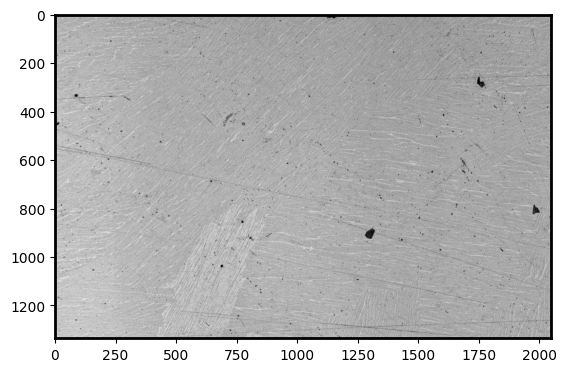

In [21]:
# Get the image dimensions
height, width, _ = image.shape

# Calculate the cropping coordinates
crop_height = height - 200

# Crop the image
cropped_image = image[:crop_height, :, :]

plt.imshow(cropped_image)
plt.show()

# Import and normalization

In [22]:
import cv2
import numpy as np

image_name = '/content/Main image_C-Laser DIC_20241119170035.png'
color_image = cv2.imread(image_name)
image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
print(f'dtype: {image.dtype}, shape: {image.shape}, min: {np.min(image)}, max: {np.max(image)}')

height, width = image.shape
# Calculate the cropping coordinates
crop_height = height - 200
# Crop the image
cropped_image = image[:crop_height, :]
#cropped_image = image[800:, 250:850]

# optional CLAHE
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(200, 200))
image = clahe.apply(cropped_image)

dtype: uint8, shape: (1536, 2048), min: 0, max: 255


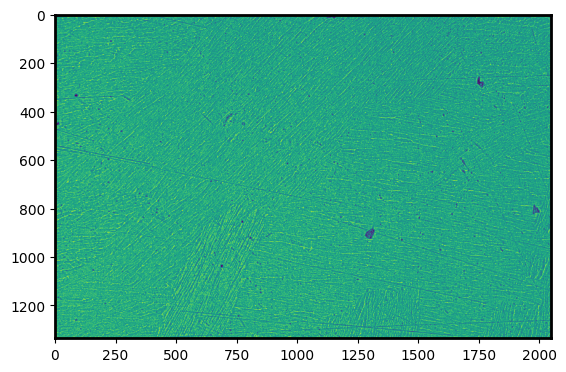

In [23]:
plt.imshow(image)

Now, let's see if we can find the common motives using the variational autoencoder based workflow.



In [24]:
# Installing pyroved and AtomAI
!pip install -q atomai git+https://github.com/ziatdinovmax/pyroVED@main

  Preparing metadata (setup.py) ... done


Here we realize Radon transform. It highlights lines in the image.

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from atomai import utils

from scipy import stats
from scipy.stats import gaussian_kde
from sklearn.mixture import GaussianMixture

import matplotlib
matplotlib.rcParams['axes.linewidth'] = 2

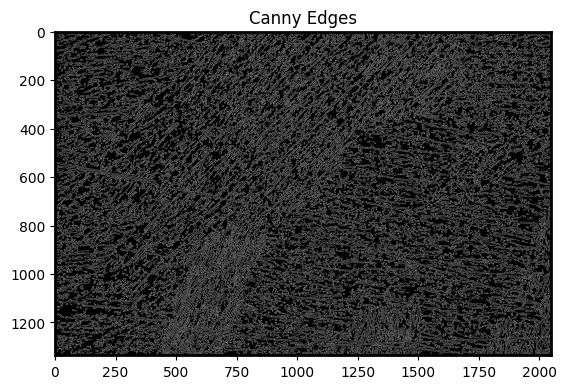

In [26]:
from skimage.feature import canny

edges = canny(image, sigma=2) # Adjust sigma as needed
fig3, ax3 = plt.subplots()
ax3.imshow(edges, cmap='gray')
ax3.set_title('Canny Edges')
plt.show()

In [27]:
image = edges

In [28]:
ws = 40
step = 10

co_ords = utils.get_coord_grid(image, step)
patches, filtered_coord, _ = utils.extract_subimages(image, co_ords, ws)

#patches = normalize(np.squeeze(patches))
print(f"Number of patches: {len(patches)}, Number of coordinates : {len(filtered_coord)}")

Number of patches: 26130, Number of coordinates : 26130


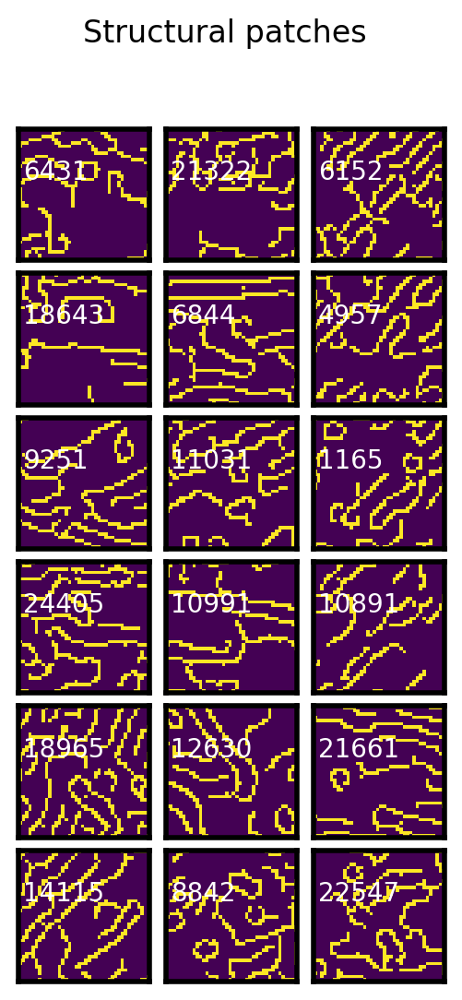

In [29]:
#plot examples of patches
fig, axes = plt.subplots(6, 3, figsize=(3, 6), dpi = 200,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

fig.suptitle('Structural patches')

for ax in axes.flat:
    i = np.random.randint(len(patches))
    ax.imshow(patches[i], interpolation='nearest')
    ax.text(1, 15, str(i), color='white')

Here we create an array of possible morphological descriptors that can be applied to image patches. These were made with a bit of the dialog with ChatGPT and wrapped into function. Make sure that error handling is done.

In [30]:
import numpy as np
import cv2
from skimage.measure import label, regionprops
from scipy.ndimage import binary_fill_holes

def calculate_patch_descriptors(patch):
    """
    Calculate an array of descriptors for a binary patch.

    Parameters:
        patch (np.ndarray): Binary image patch.

    Returns:
        tuple: (np.ndarray, list) where the array contains the descriptors and
               the list contains the names of the descriptors.
    """
    descriptors = []
    descriptor_names = []

    # Ensure the patch is binary
    patch = (patch > 0).astype(np.uint8)

    def safe_append(descriptor_name, calculation_function):
        """
        Safely appends a descriptor to the list, setting it to zero if an exception occurs.

        Parameters:
            descriptor_name (str): Name of the descriptor.
            calculation_function (function): Function that calculates the descriptor.
        """
        try:
            descriptors.append(calculation_function())
        except Exception as e:
            print(f"Error calculating {descriptor_name}: {e}")
            descriptors.append(0)
        descriptor_names.append(descriptor_name)

    # 1. Uniformity
    safe_append("Uniformity", lambda: np.sum(patch == np.bincount(patch.flatten()).argmax()) / patch.size)

    # 2. Edge Density
    edges = cv2.Canny(patch, 50, 150)
    safe_append("Edge Density", lambda: np.sum(edges > 0) / patch.size)

    # 3. Perimeter Length
    safe_append("Perimeter Length", lambda: np.sum(edges > 0))

    # 4. Area Coverage
    safe_append("Area Coverage", lambda: np.sum(patch > 0) / patch.size)

    # 5. Aspect Ratio
    labeled_patch = label(patch)
    regions = regionprops(labeled_patch)
    safe_append("Aspect Ratio", lambda: regions[0].major_axis_length / regions[0].minor_axis_length if regions and regions[0].minor_axis_length > 0 else 0)

    # 6. Circularity
    area = np.sum(patch > 0)
    safe_append("Circularity", lambda: (4 * np.pi * area) / (np.sum(edges > 0) ** 2) if np.sum(edges > 0) > 0 else 0)

    # 7. Compactness
    safe_append("Compactness", lambda: area / regions[0].area if regions and regions[0].area > 0 else 0)

    # 8. Complexity (Number of Connected Components)
    safe_append("Complexity", lambda: len(np.unique(labeled_patch)) - 1)

    # 9. Average Orientation
    sobel_x = cv2.Sobel(patch, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(patch, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    gradient_orientation = np.arctan2(sobel_y, sobel_x)
    edge_pixels = gradient_magnitude > 0  # Consider non-zero gradient magnitudes as edges
    safe_append("Average Orientation", lambda: np.mean(gradient_orientation[edge_pixels]) if np.sum(edge_pixels) > 0 else 0)

    # 10. Edge Symmetry
    vertical_flip = np.flipud(patch)
    horizontal_flip = np.fliplr(patch)
    safe_append("Edge Symmetry", lambda: (np.sum(patch == vertical_flip) / patch.size + np.sum(patch == horizontal_flip) / patch.size) / 2)

    return np.array(descriptors), descriptor_names

# Example usage
example_patch = np.zeros((40, 40), dtype=np.uint8)
cv2.rectangle(example_patch, (10, 10), (30, 30), 1, -1)  # Add a square
cv2.line(example_patch, (5, 5), (35, 35), 1, 1)  # Add a diagonal line

# Calculate descriptors
descriptors, descriptor_names = calculate_patch_descriptors(example_patch)

# Display results
print("Descriptors:")
for name, value in zip(descriptor_names, descriptors):
    print(f"{name}: {value:.3f}")


Descriptors:
Uniformity: 0.718
Edge Density: 0.000
Perimeter Length: 0.000
Area Coverage: 0.282
Aspect Ratio: 1.101
Circularity: 0.000
Compactness: 1.000
Complexity: 1.000
Average Orientation: 0.741
Edge Symmetry: 0.961


In [31]:
descriptors, descriptor_names = calculate_patch_descriptors(patches[1].astype(float))
descriptors

Error calculating Aspect Ratio: math domain error


array([ 0.88125   ,  0.        ,  0.        ,  0.11875   ,  0.        ,
        0.        , 27.14285714, 10.        ,  0.29662533,  0.7925    ])

In [32]:
# Apply the descriptor calculation to all patches

all_descriptors = []
for i, patch in enumerate(patches):
    descriptors, descriptor_names = calculate_patch_descriptors(patch.astype(float))
    all_descriptors.append(descriptors)
    #print(f"Patch {i + 1}:")
    #for name, value in zip(descriptor_names, descriptors):
    #    print(f"  {name}: {value:.3f}")
    #print()

# Convert to a NumPy array for easier manipulation if needed
all_descriptors = np.array(all_descriptors)

# Display the shape of the resulting descriptor array
print("Shape of all descriptors array:", all_descriptors.shape)


Streaming output truncated to the last 5000 lines.
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error
Error calculating Aspect Ratio: math domain error

In [33]:
d1, d2 = np.unique(filtered_coord[:,0]).shape[0], np.unique(filtered_coord[:,1]).shape[0]
print(d1, d2)

130 201


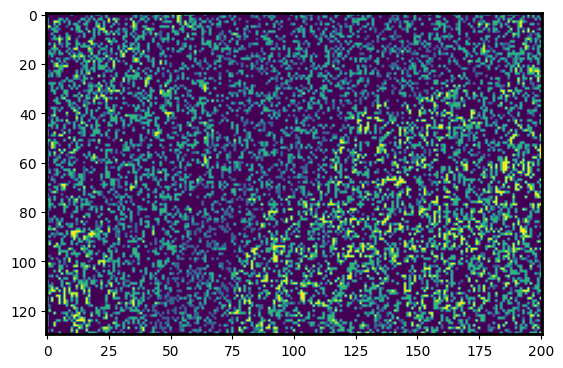

In [34]:
from sklearn.mixture import GaussianMixture

#X = np.array(patches).reshape(len(patches), -1)
X = all_descriptors #np.array(radon_transforms1).reshape(len(radon_transforms1), -1)

gmm = GaussianMixture(n_components=4, random_state=0)
gmm.fit(X)
cluster_labels = gmm.predict(X)

plt.imshow(cluster_labels.reshape(d1, d2))

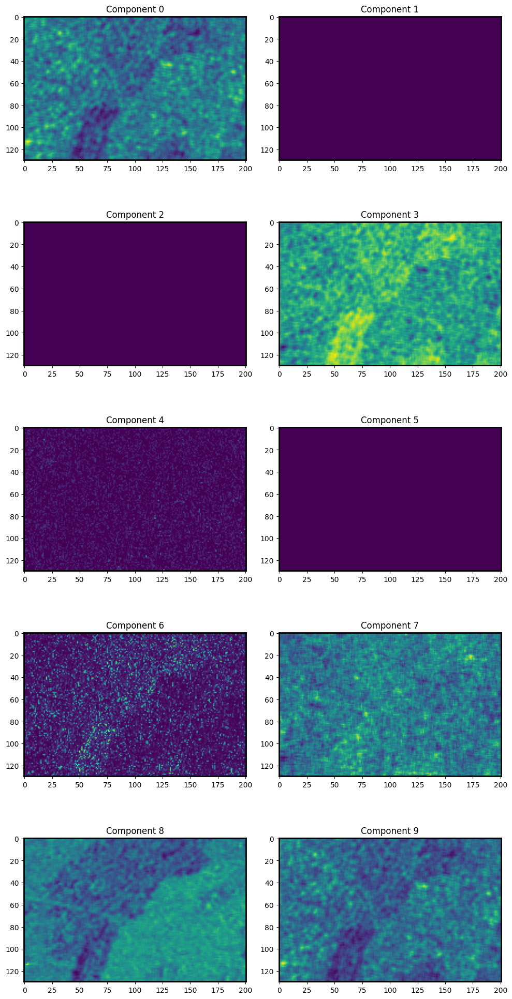

In [35]:
fig, axes = plt.subplots(5, 2, figsize=(10, 20))  # Adjust figsize as needed

# Iterate through the components and display images
for i in range(10):  # Display the first 10 components (adjust as needed)
    row = i // 2
    col = i % 2
    try:
        axes[row, col].imshow(all_descriptors[:, i].reshape(d1, d2))
        axes[row, col].set_title(f"Component {i}")
    except IndexError:
        print(f"Skipping component {i} due to index out of bounds")
        break

plt.tight_layout()  # Adjust layout to prevent overlapping titles
plt.show()

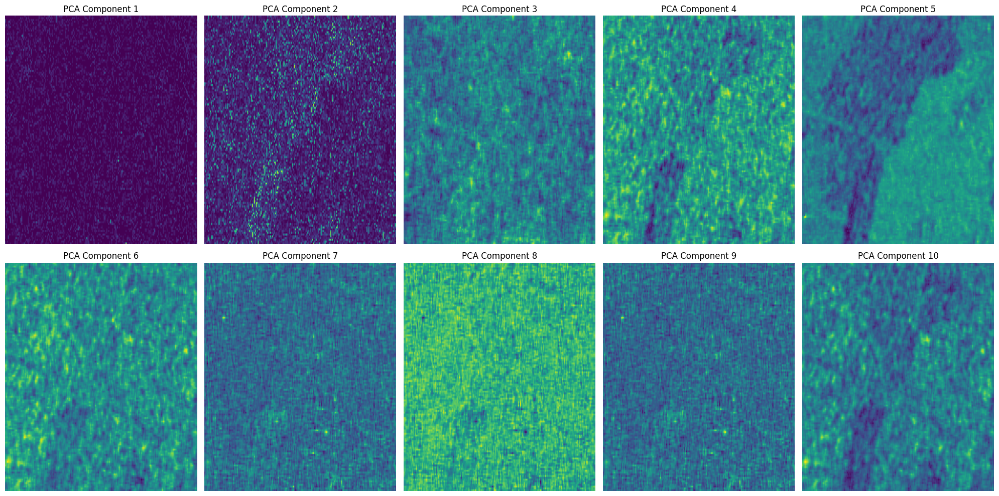

Explained variance ratio for components:
[1.00000000e+00 4.01779111e-13 6.94802176e-16 1.02598244e-16
 3.69961875e-18 1.73195658e-19 2.91477519e-21 7.56538922e-35
 0.00000000e+00 0.00000000e+00]


In [71]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
pca_components = pca.fit_transform(all_descriptors)

# Plot PCA components in a grid with 3 columns
n_columns = 5
n_rows = (min(10, pca_components.shape[1]) + n_columns - 1) // n_columns

plt.figure(figsize=(20, 5 * n_rows))
for i in range(min(10, pca_components.shape[1])):
    plt.subplot(n_rows, n_columns, i + 1)
    component_map = pca_components[:, i].reshape(d1, d2)
    plt.imshow(component_map, cmap='viridis', aspect='auto')
    plt.title(f"PCA Component {i + 1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained variance ratio for components:")
print(explained_variance_ratio[:10])


Some of the images and components show decent segmentation!

In [37]:
import cv2
import numpy as np

image_name = '/content/Main image_C-Laser DIC_20241119170035.png'
color_image = cv2.imread(image_name)
image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
print(f'dtype: {image.dtype}, shape: {image.shape}, min: {np.min(image)}, max: {np.max(image)}')

height, width = image.shape
# Calculate the cropping coordinates
crop_height = height - 200
# Crop the image
cropped_image = image[:crop_height, :]
#cropped_image = image[800:, 250:850]

# optional CLAHE
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(200, 200))
image = clahe.apply(cropped_image)

dtype: uint8, shape: (1536, 2048), min: 0, max: 255


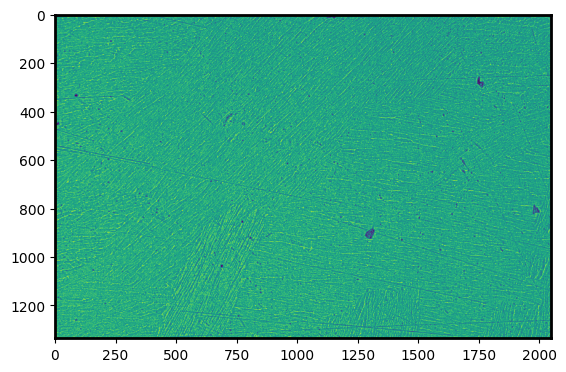

In [38]:
plt.imshow(image)

Now, let's see if we can find the common motives using the variational autoencoder based workflow.



# Radon transform and MRF

In [39]:
# Installing pyroved and AtomAI
!pip install -q atomai git+https://github.com/ziatdinovmax/pyroVED@main

  Preparing metadata (setup.py) ... done


In [40]:
from atomai import utils

In [41]:
ws = 40
step = 10
co_ords = utils.get_coord_grid(image, step )
patches, filtered_coord, _ = utils.extract_subimages(image, co_ords, ws)
#patches = normalize(np.squeeze(patches))
print(f"Number of patches: {len(patches)}, Number of coordinates : {len(filtered_coord)}")

Number of patches: 26130, Number of coordinates : 26130


In [42]:
patches.shape

(26130, 40, 40, 1)

Here we realize Radon transform. It highlights lines in the image.

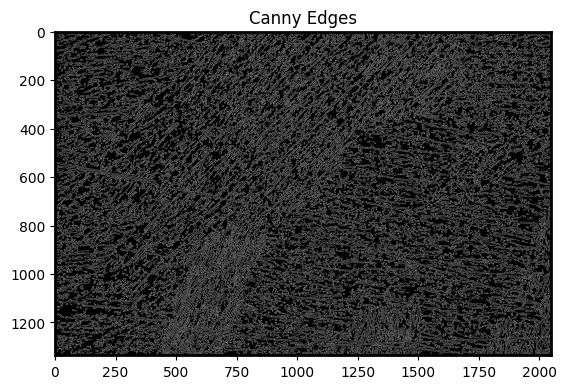

In [43]:
from skimage.feature import canny

edges = canny(image, sigma=2) # Adjust sigma as needed
fig3, ax3 = plt.subplots()
ax3.imshow(edges, cmap='gray')
ax3.set_title('Canny Edges')
plt.show()

In [44]:
image = edges

In [45]:
ws = 40
step = 20
co_ords = utils.get_coord_grid(image, step )
patches, filtered_coord, _ = utils.extract_subimages(image, co_ords, ws)
#patches = normalize(np.squeeze(patches))
print(f"Number of patches: {len(patches)}, Number of coordinates : {len(filtered_coord)}")

Number of patches: 6565, Number of coordinates : 6565


In [46]:
from skimage.transform import radon

radon_transforms = []

for patch in patches.squeeze():
  patch = np.array(patch)
  radon_transform = radon(patch)
  radon_transforms.append(radon_transform)

radon_transforms[0].shape

/usr/local/lib/python3.10/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


(40, 180)

(6565, 40, 30)

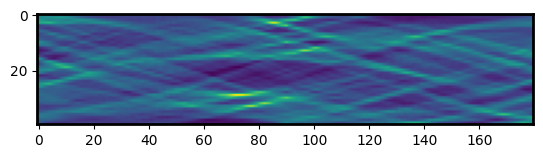

In [47]:
np.array(radon_transforms).shape
plt.imshow(np.array(radon_transforms)[20])
radon_transforms1 = np.array(radon_transforms)[:,:,::6] #we decimate the data in angle dimension so that GMM ocnverges faster
radon_transforms1.shape

Now the GMM on Radon transforms gives pretty good answer

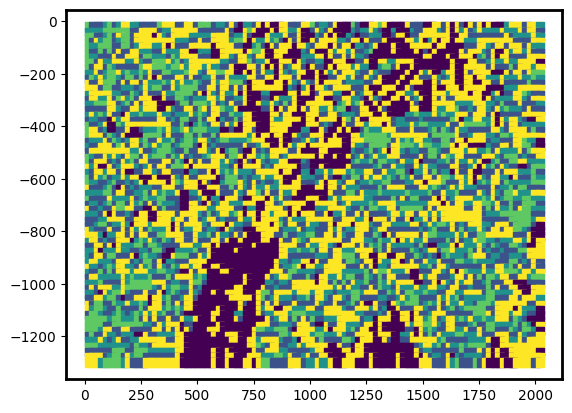

In [48]:
from sklearn.mixture import GaussianMixture

#X = np.array(patches).reshape(len(patches), -1)
X = np.array(radon_transforms1).reshape(len(radon_transforms1), -1)

gmm = GaussianMixture(n_components=5, random_state=0)
gmm.fit(X)
cluster_labels = gmm.predict(X)
probabilities = gmm.predict_proba(X)

plt.scatter(filtered_coord[:, 1], -filtered_coord[:, 0], c=cluster_labels, marker = 's')

The result is actually not bad. Basically if you look at your image and at the GMM map carefully, you can see that the regions corresponding to clusters 1 and 2 correspond to the patterns in your image. So we are definitely on the right track! Also, if i increas ethe number of clusters, then new ones show at the boundary between original two, which tells me that 2 is the right number.

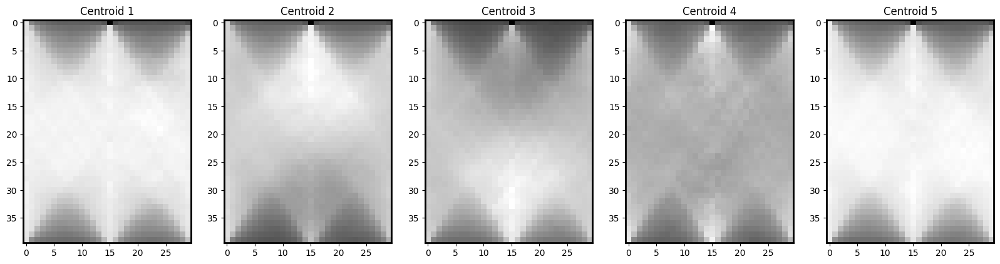

In [49]:
centroids = gmm.means_  # Get the centroids of the GMM clusters

# Reshape centroids to images
centroid_images = centroids.reshape(-1, ws, 30)

# Plot centroid images
fig, axes = plt.subplots(1, len(centroids), figsize=(20, 10))
for i, ax in enumerate(axes):
    ax.imshow(centroid_images[i], cmap='gray')
    ax.set_title(f'Centroid {i+1}')
plt.show()

In [50]:
probabilities.shape

(6565, 5)

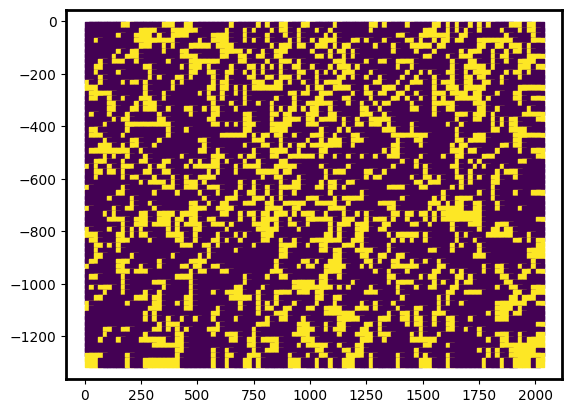

In [51]:
plt.scatter(filtered_coord[:, 1], -filtered_coord[:, 0], c=probabilities[:,4], marker = 's')

In [52]:
np.unique(filtered_coord[:, 1]).shape, np.unique(filtered_coord[:, 0]).shape

((101,), (65,))

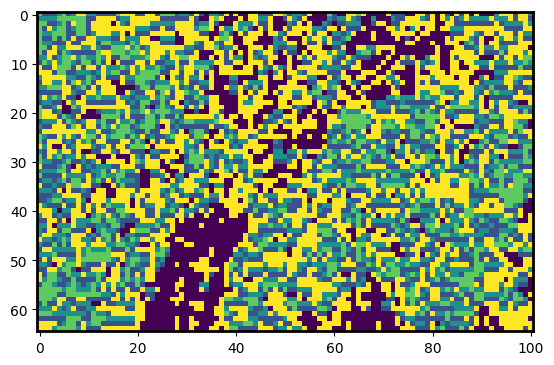

In [53]:
cluster_labels.shape
noisy_image = cluster_labels.reshape(65, 101)
plt.imshow(noisy_image)

Here we try to make the Markov Random Field denoising

Iteration 1/100
Iteration 2/100
Iteration 3/100
Iteration 4/100
Iteration 5/100
Iteration 6/100
Iteration 7/100
Iteration 8/100
Iteration 9/100
Iteration 10/100
Iteration 11/100
Iteration 12/100
Iteration 13/100
Iteration 14/100
Iteration 15/100
Iteration 16/100
Iteration 17/100
Iteration 18/100
Iteration 19/100
Iteration 20/100
Iteration 21/100
Iteration 22/100
Iteration 23/100
Iteration 24/100
Iteration 25/100
Iteration 26/100
Iteration 27/100
Iteration 28/100
Iteration 29/100
Iteration 30/100
Iteration 31/100
Iteration 32/100
Iteration 33/100
Iteration 34/100
Iteration 35/100
Iteration 36/100
Iteration 37/100
Iteration 38/100
Iteration 39/100
Iteration 40/100
Iteration 41/100
Iteration 42/100
Iteration 43/100
Iteration 44/100
Iteration 45/100
Iteration 46/100
Iteration 47/100
Iteration 48/100
Iteration 49/100
Iteration 50/100
Iteration 51/100
Iteration 52/100
Iteration 53/100
Iteration 54/100
Iteration 55/100
Iteration 56/100
Iteration 57/100
Iteration 58/100
Iteration 59/100
Iterat

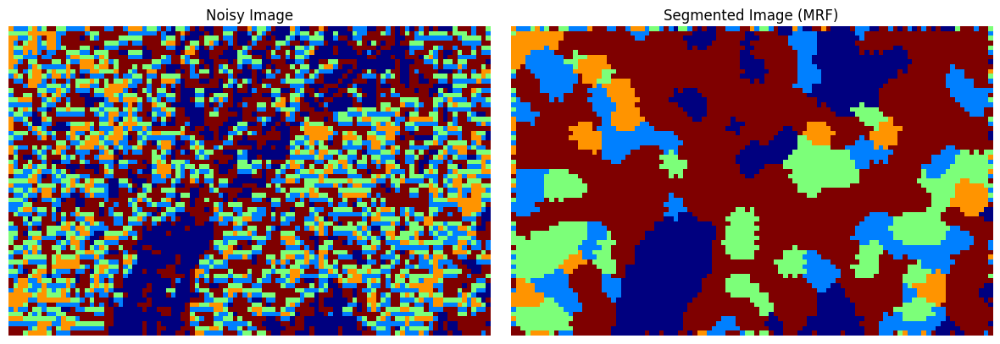

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def mrf_segmentation(noisy_image, num_classes, beta=1.0, max_iter=10):
    """
    Perform MRF segmentation using Iterated Conditional Modes (ICM).

    Parameters:
        noisy_image (np.ndarray): Noisy labeled image.
        num_classes (int): Number of unique labels/classes.
        beta (float): Smoothness parameter for MRF.
        max_iter (int): Maximum number of iterations.

    Returns:
        np.ndarray: Denoised segmented image.
    """
    # Initialize segmented image with noisy labels
    segmented_image = noisy_image.copy()
    height, width = noisy_image.shape

    # Precompute neighborhood shifts
    neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1),(1, 1), (1, -1), (-1, 1), (-1, -1)]

    for iteration in range(max_iter):
        print(f"Iteration {iteration + 1}/{max_iter}")
        updated_image = segmented_image.copy()

        # Iterate over each pixel
        for i in range(height):
            for j in range(width):
                # Skip pixel if it's on the boundary
                if i == 0 or i == height - 1 or j == 0 or j == width - 1:
                    continue

                # Compute unary potential (data term)
                unary_potential = np.zeros(num_classes)
                for k in range(num_classes):
                    unary_potential[k] = (noisy_image[i, j] - k) ** 2

                # Compute pairwise potential (smoothness term)
                pairwise_potential = np.zeros(num_classes)
                for dx, dy in neighbors:
                    ni, nj = i + dx, j + dy
                    if 0 <= ni < height and 0 <= nj < width:
                        pairwise_potential += beta * (segmented_image[ni, nj] != np.arange(num_classes))

                # Total potential
                total_potential = unary_potential + pairwise_potential

                # Update pixel to class with minimum potential
                updated_image[i, j] = np.argmin(total_potential)

        # Check for convergence
        '''
        if np.all(updated_image == segmented_image):
            print("Converged!")
            break
        '''
        segmented_image = updated_image

    return segmented_image

# Perform MRF segmentation
segmented_image = mrf_segmentation(noisy_image, num_classes=5, beta=20, max_iter=100)

# Plot results
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.title("Noisy Image")
plt.imshow(noisy_image, cmap='jet')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Segmented Image (MRF)")
plt.imshow(segmented_image, cmap='jet')
plt.axis('off')

plt.tight_layout()
plt.show()

May be a good idea to explore how the segmentation results depend on parameters. Simply wrap it as a function of denoising parameters and compare the results

# VAE analysis - grid

In [55]:
# Importing necessary packages
import torch
from torchvision.utils import make_grid
import torch.nn as nn

import pyroved as pv

# We will use atomai just to create the dataset (sub-images)
import atomai as aoi
from atomai import utils

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker

import seaborn as sns
from scipy import stats
from scipy.stats import gaussian_kde
from sklearn.mixture import GaussianMixture
tt = torch.tensor

import matplotlib
matplotlib.rcParams['axes.linewidth'] = 2

In [56]:
#Choose a window size and step size to make patches
# This is pretty much the same approach as you used, but realized with AtomAI function for convenience

ws = 10
step = 10
invariance = ['r', 't'] #['t'] # Choose the invariances you don't want to be captured by the latent variables. YOu can use None, 'r', "t', and ['r','t']"

In [57]:
co_ords = utils.get_coord_grid(image, step )
patches, filtered_coord, _ = utils.extract_subimages(image, co_ords, ws)
#patches = normalize(np.squeeze(patches))
print(f"Number of patches: {len(patches)}, Number of coordinates : {len(filtered_coord)}")

Number of patches: 27132, Number of coordinates : 27132


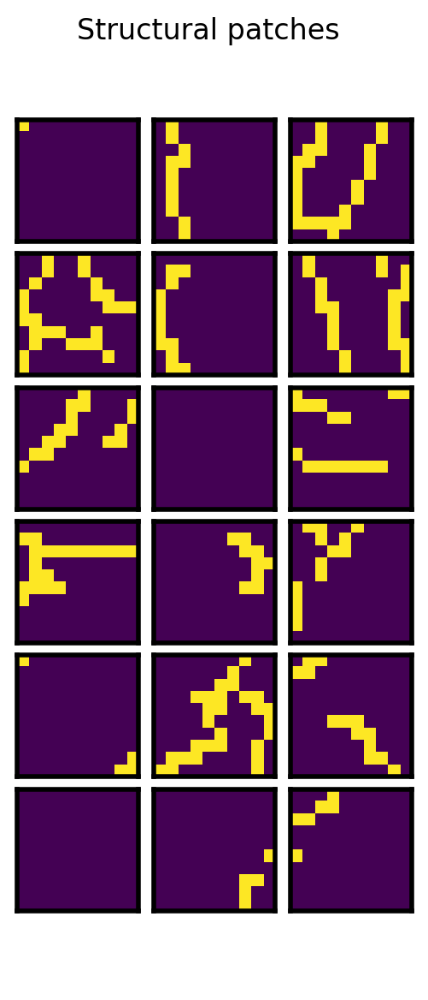

In [58]:
#plot examples of patches
fig, axes = plt.subplots(6, 3, figsize=(3, 6), dpi = 200,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

fig.suptitle('Structural patches')

for ax in axes.flat:
    i = np.random.randint(len(patches))
    ax.imshow(patches[i], interpolation='nearest')
    ax.text(1, 15, str(i), color='white')

In [59]:
#construct image stack and loader for VAE
vae = torch.tensor(patches).float()
vae_loader = pv.utils.init_dataloader(vae, batch_size=120)

In [60]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)

vae_vanilla = pv.models.iVAE(in_dim, latent_dim=2, invariances= invariance, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae_vanilla)
training_losses = []

# Train for n epochs:
for e in range(250):
    trainer.step(vae_loader)
    trainer.print_statistics()
    # training_loss = trainer.loss
    # training_losses.append(training_loss)

Epoch: 1 Training loss: 45.2528
Epoch: 2 Training loss: 44.4828
Epoch: 3 Training loss: 43.5999
Epoch: 4 Training loss: 43.3686
Epoch: 5 Training loss: 43.0259
Epoch: 6 Training loss: 42.6859
Epoch: 7 Training loss: 42.5109
Epoch: 8 Training loss: 42.3718
Epoch: 9 Training loss: 42.2537
Epoch: 10 Training loss: 42.1554
Epoch: 11 Training loss: 42.0691
Epoch: 12 Training loss: 41.9784
Epoch: 13 Training loss: 41.9096
Epoch: 14 Training loss: 41.8311
Epoch: 15 Training loss: 41.7599
Epoch: 16 Training loss: 41.6291
Epoch: 17 Training loss: 41.5412
Epoch: 18 Training loss: 41.4792
Epoch: 19 Training loss: 41.4203
Epoch: 20 Training loss: 41.3079
Epoch: 21 Training loss: 41.2319
Epoch: 22 Training loss: 41.1378
Epoch: 23 Training loss: 41.0626
Epoch: 24 Training loss: 40.9999
Epoch: 25 Training loss: 40.9091
Epoch: 26 Training loss: 40.8165
Epoch: 27 Training loss: 40.7504
Epoch: 28 Training loss: 40.6666
Epoch: 29 Training loss: 40.5414
Epoch: 30 Training loss: 40.4053
Epoch: 31 Training 

This is latent representations of microstructure. It did not converge particulalry well - we see features, but the expressive power of VAE for 2 latent dimensionas plus angle is not enough here. So we see strong feature variability, and hence cannot find robust latent factors.

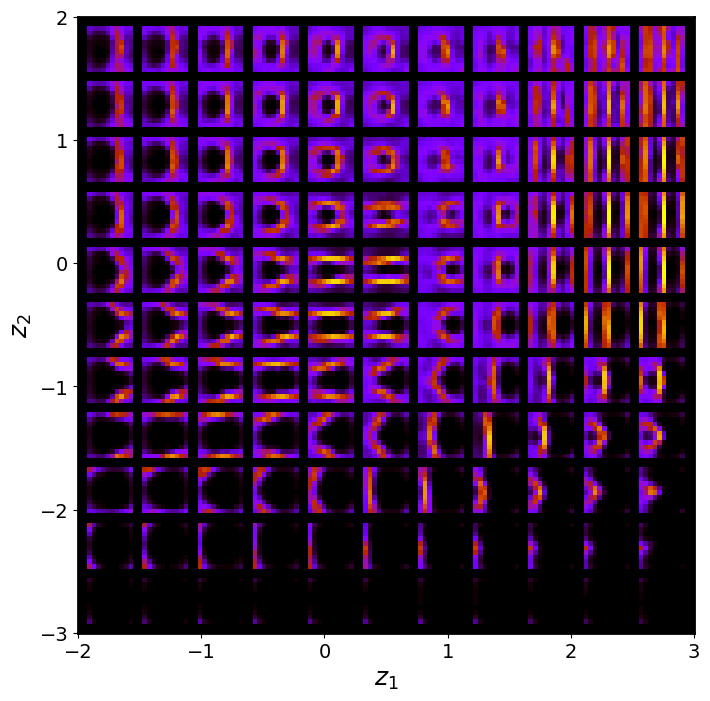

In [61]:
vae_vanilla.manifold2d(d = 11, z_coord = [-2,3,-3,2]);

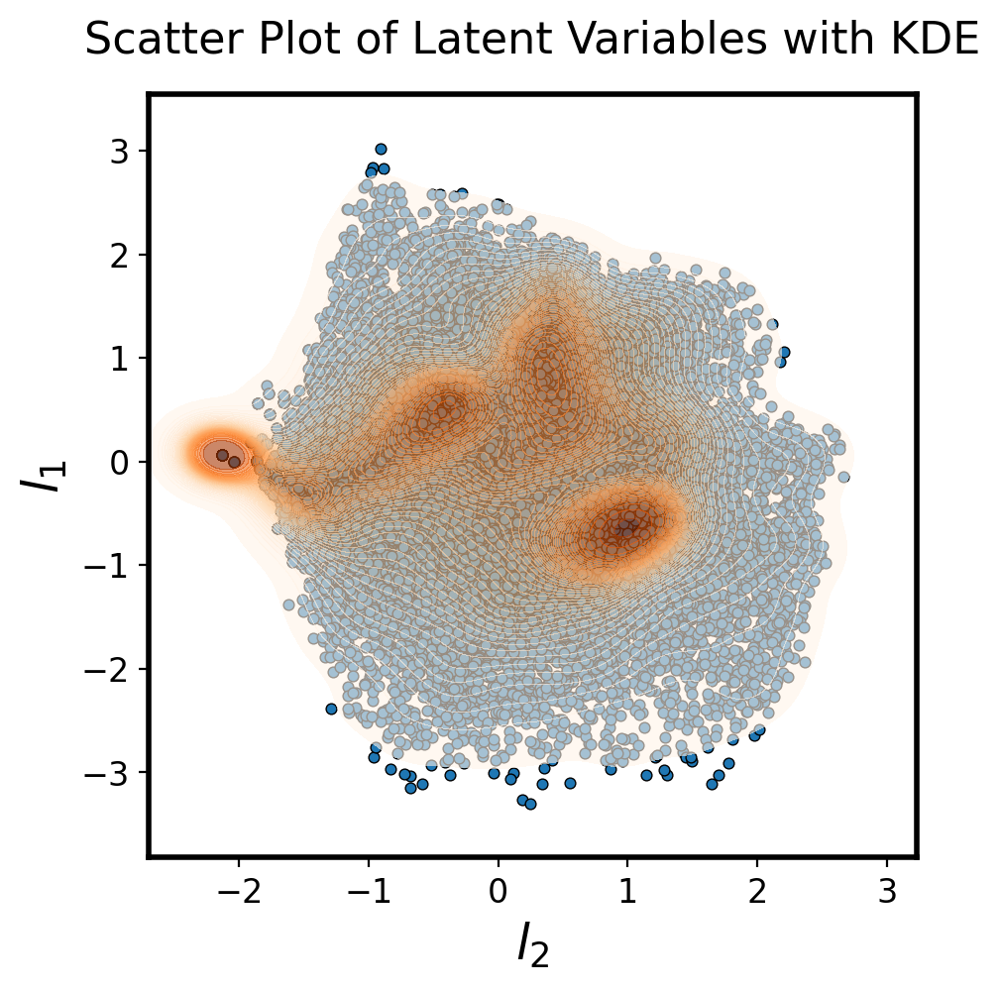

In [62]:
z_mean_std_PTO, z_std_PTO = vae_vanilla.encode(vae)
l1, l2 = z_mean_std_PTO[:,-2], z_mean_std_PTO[:,-1]

plt.figure(figsize=(5, 5), facecolor='white', dpi = 200)
sc = plt.scatter(l1, l2,  s=15, edgecolor='k', linewidth=0.5)
sns.kdeplot(x=l1, y=l2, cmap="Oranges", levels = 50, thresh = 0.005, alpha = 0.6, fill=True)
plt.xlabel("$l_2$", fontsize=18)
plt.ylabel("$l_1$", fontsize=18)
plt.title("Scatter Plot of Latent Variables with KDE", fontsize=16, pad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

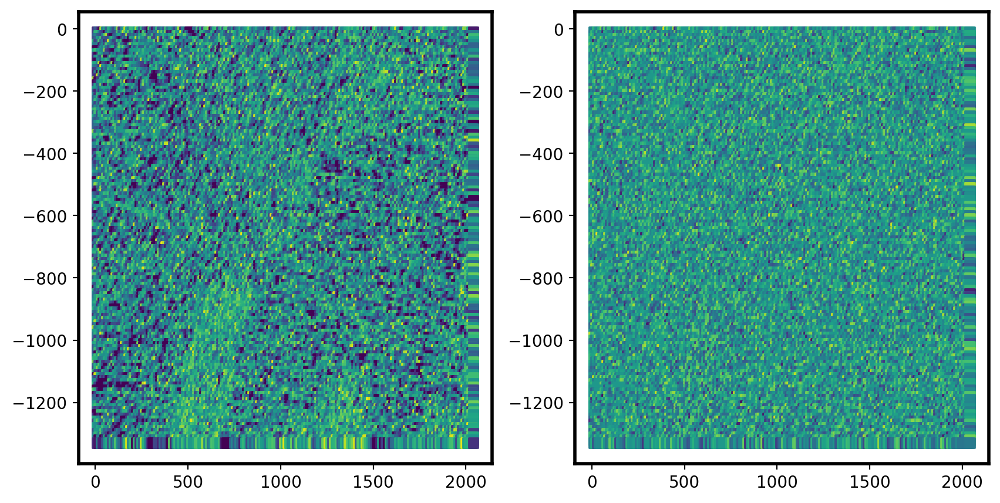

In [63]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=200)
axes[0].scatter(filtered_coord[:, 1], -filtered_coord[:, 0], c=l1, marker = 's')
axes[1].scatter(filtered_coord[:, 1], -filtered_coord[:, 0], c=l2, marker = 's')

In [64]:
np.unique(filtered_coord[:, 1]).shape, np.unique(-filtered_coord[:, 0]).shape

((204,), (133,))

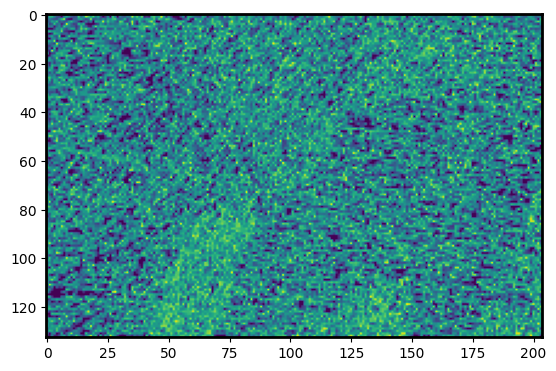

In [65]:
noisy_image = np.array(l1.reshape(133, 204))
plt.imshow(noisy_image)

## MRF denoising of latent image

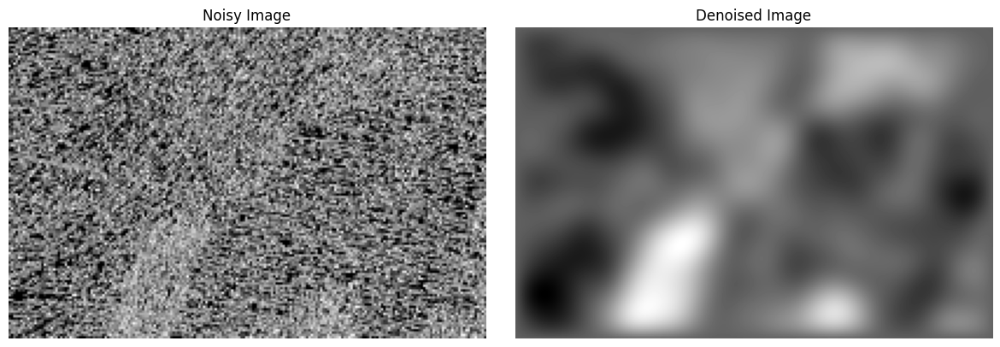

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

def continuous_mrf_denoising(noisy_image, lambda_param=1.0, beta=1.0, num_iterations=100):
    """
    Denoise a continuous-valued image using a Markov Random Field (MRF) approach.

    Parameters:
        noisy_image (np.ndarray): Noisy input image (continuous values).
        lambda_param (float): Weight of the data term.
        beta (float): Weight of the smoothness term.
        num_iterations (int): Number of optimization iterations.

    Returns:
        np.ndarray: Denoised image.
    """
    denoised_image = noisy_image.copy()

    # Define 4-connectivity kernel for smoothness term
    kernel = np.array([[1, 1, 1],
                       [1, 0, 1],
                       [1, 1, 1]])

    for _ in range(num_iterations):
        # Compute smoothness term: Laplacian of the image
        smoothness_term = convolve(denoised_image, kernel, mode='constant', cval=0) - 4 * denoised_image

        # Update denoised image using gradient descent
        denoised_image += -lambda_param * (denoised_image - noisy_image) + beta * smoothness_term

    return denoised_image
'''
# Example usage
np.random.seed(42)
true_image = np.zeros((100, 100))
true_image[30:70, 30:70] = 1  # Square object

# Add Gaussian noise
noisy_image = true_image + np.random.normal(0, 0.2, size=true_image.shape)
'''
# Apply MRF denoising
denoised_image = continuous_mrf_denoising(noisy_image, lambda_param=0.3, beta=0.1, num_iterations=100)

# Visualize results
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.title("Noisy Image")
plt.imshow(noisy_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Denoised Image")
plt.imshow(denoised_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


<ipython-input-66-648907852157>:27: RuntimeWarning: invalid value encountered in subtract
  smoothness_term = convolve(denoised_image, kernel, mode='constant', cval=0) - 4 * denoised_image
<ipython-input-66-648907852157>:30: RuntimeWarning: invalid value encountered in multiply
  denoised_image += -lambda_param * (denoised_image - noisy_image) + beta * smoothness_term
<ipython-input-66-648907852157>:27: RuntimeWarning: overflow encountered in multiply
  smoothness_term = convolve(denoised_image, kernel, mode='constant', cval=0) - 4 * denoised_image
<ipython-input-66-648907852157>:27: RuntimeWarning: overflow encountered in subtract
  smoothness_term = convolve(denoised_image, kernel, mode='constant', cval=0) - 4 * denoised_image
<ipython-input-66-648907852157>:30: RuntimeWarning: invalid value encountered in add
  denoised_image += -lambda_param * (denoised_image - noisy_image) + beta * smoothness_term


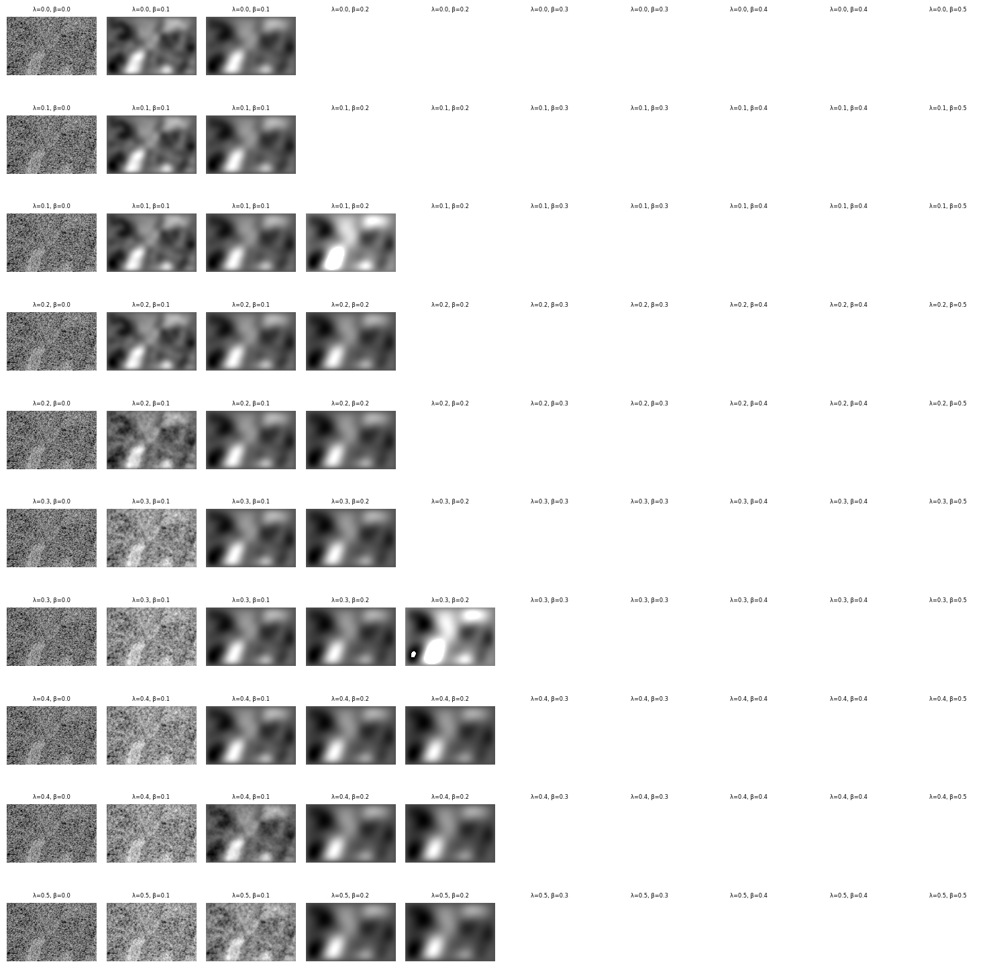

In [67]:
# Generate grid of lambda and beta values
lambda_values = np.linspace(0, 0.5, 10)
beta_values = np.linspace(0, 0.5, 10)

# Create a 10x10 grid of denoised images
fig, axes = plt.subplots(10, 10, figsize=(15, 15))
for i, lambda_param in enumerate(lambda_values):
    for j, beta in enumerate(beta_values):
        denoised_image = continuous_mrf_denoising(noisy_image, lambda_param=lambda_param, beta=beta, num_iterations=200)
        ax = axes[i, j]
        ax.imshow(denoised_image, cmap='gray')
        ax.axis('off')
        ax.set_title(f"λ={lambda_param:.1f}, β={beta:.1f}", fontsize=6)

plt.tight_layout()
plt.show()

## Segmentation of latent images

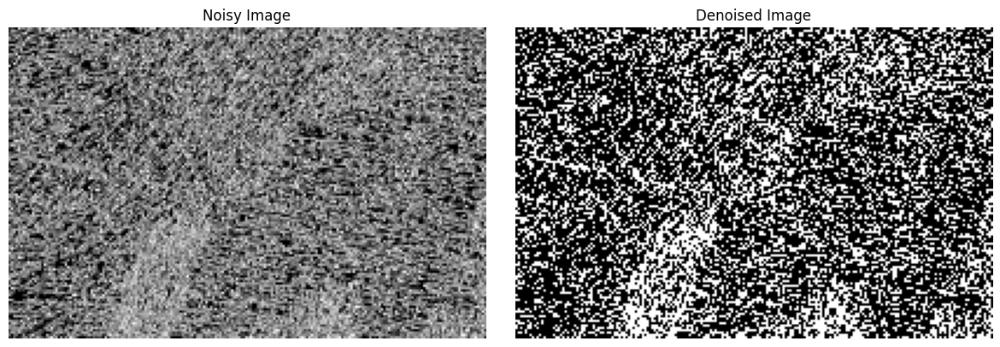

In [68]:
import numpy as np
import matplotlib.pyplot as plt

def double_well_potential(x, alpha=1.0):
    """Double-well potential favoring values near 0 or 1."""
    return alpha * (x**2) * (x - 1)**2

def energy(image, noisy_image, beta, alpha):
    """Compute total energy for the image."""
    U = double_well_potential(image, alpha).sum()  # Double-well potential term
    smoothness = beta * np.sum((image[:-1, :] - image[1:, :])**2 + (image[:, :-1] - image[:, 1:])**2)  # Smoothness term
    return U + np.sum((image - noisy_image)**2) + smoothness

def simulated_annealing_denoising(noisy_image, alpha=10.0, beta=0.5, max_iter=500, initial_temp=1.0, cooling_rate=0.99):
    """
    Denoise a continuous-valued image to binary (0 or 1) using simulated annealing.

    Parameters:
        noisy_image (np.ndarray): Input noisy image with continuous values.
        alpha (float): Strength of the double-well potential.
        beta (float): Smoothness term weight.
        max_iter (int): Maximum number of iterations.
        initial_temp (float): Initial temperature for annealing.
        cooling_rate (float): Cooling rate for temperature reduction.

    Returns:
        np.ndarray: Binary denoised image (0 or 1 values).
    """
    image = noisy_image.copy()  # Start from the noisy image
    temp = initial_temp

    for _ in range(max_iter):
        y, x = np.random.randint(0, image.shape[0]), np.random.randint(0, image.shape[1])

        current_value = image[y, x]
        new_value = np.clip(current_value + np.random.normal(scale=0.1), 0, 1)  # Propose a new state

        # Compute energy difference
        current_energy = double_well_potential(current_value, alpha)
        new_energy = double_well_potential(new_value, alpha)

        # Smoothness term
        neighbors = []
        if y > 0: neighbors.append(image[y-1, x])
        if y < image.shape[0]-1: neighbors.append(image[y+1, x])
        if x > 0: neighbors.append(image[y, x-1])
        if x < image.shape[1]-1: neighbors.append(image[y, x+1])

        current_smoothness = beta * sum((current_value - n)**2 for n in neighbors)
        new_smoothness = beta * sum((new_value - n)**2 for n in neighbors)

        delta_energy = (new_energy + new_smoothness) - (current_energy + current_smoothness)

        # Metropolis acceptance criterion
        if delta_energy < 0 or np.random.rand() < np.exp(-delta_energy / temp):
            image[y, x] = new_value  # Accept the new state

        # Reduce temperature
        temp *= cooling_rate

    # Threshold final values to binary
    return (image > 0.5).astype(int)

# Apply simulated annealing
binary_image = simulated_annealing_denoising(noisy_image, alpha=10.0, beta=10.0, max_iter=10000, initial_temp=20, cooling_rate=0.99)

# Visualize results
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.title("Noisy Image")
plt.imshow(noisy_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Denoised Image")
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()
